In [1]:
import pandas as pd

# Leggi il file come edge-list: ignora righe che iniziano con '#' e usa whitespace come separatore
df_raw = pd.read_csv("./data/cit-HepTh.txt", comment='#', sep='\\s+', header=None, engine='python')

# Prendiamo le prime due colonne come source/target
citations = df_raw.iloc[:, :2].copy()
citations.columns = ['source', 'target']

citations['source'] = pd.to_numeric(citations['source'])
citations['target'] = pd.to_numeric(citations['target'])

citations.to_csv("data/citations.csv", index=False)


In [2]:
import re
import pandas as pd
import warnings
from pathlib import Path
from dateutil import parser, tz
from dateutil.parser._parser import UnknownTimezoneWarning

warnings.filterwarnings("ignore", category=UnknownTimezoneWarning)

records = []

# Chiavi principali
keys = ["email", "date", "date_revised", "title", "authors", "comments", "journal_ref"]

# Mapping fusi orari
tzinfos = {
    "EST": tz.gettz("America/New_York"),
    "EDT": tz.gettz("America/New_York"),
    "CST": tz.gettz("America/Chicago"),
    "CDT": tz.gettz("America/Chicago"),
    "PST": tz.gettz("America/Los_Angeles"),
    "PDT": tz.gettz("America/Los_Angeles"),
    "BST": tz.gettz("Europe/London"),
    "CET": tz.gettz("Europe/Paris"),
    "CEST": tz.gettz("Europe/Paris"),
    "JST": tz.gettz("Asia/Tokyo"),
    "KST": tz.gettz("Asia/Seoul"),
}

def normalize_email(email_str):
    if not email_str:
        return None
    match = re.search(r'[\w\.-]+@[\w\.-]+', email_str)
    if match:
        return match.group(0).lower()
    return None

def extract_journal_ref(text):
    """
    Estrae il campo Journal-ref, anche se preceduto da spazi o con formattazioni diverse.
    """
    match = re.search(r'^\s*Journal[- ]ref\s*:\s*(.+)', text, re.I | re.MULTILINE)
    if match:
        return match.group(1).strip()
    return None

def extract_pages(comment_str):
    """
    Estrae il numero di pagine dai commenti, gestendo vari formati:
    17pages, pages17, pages 17, 17 pages, pp.17, 17pp., pp 17,
    17 pp, p 17, 17 p, 17p, p17
    """
    if not comment_str:
        return None
    
    # regex che cattura un numero seguito o preceduto da "p", "pp", "pages", ecc.
    match = re.search(r'(?i)\b(?:p{1,2}|pages?)\.?\s*(\d+)\b|\b(\d+)\s*(?:p{1,2}|pages?)\.?\b', comment_str)
    
    if match:
        # match.group(1) o match.group(2) conterranno il numero
        return int(match.group(1) or match.group(2))
    return None


def normalize_date(date_str):
    if not date_str:
        return None
    try:
        dt = parser.parse(date_str, fuzzy=True, tzinfos=tzinfos)
        return dt.strftime("%Y-%m-%d")
    except Exception:
        return None

def extract_date_fields(text):
    """
    Estrae le date originali e revised, anche con suffissi v1, v2, ecc.
    """
    dates = {}

    # Date originale
    match = re.search(r'^Date:\s*(.+?)(?:\s+\(\d+kb\))?$', text, re.MULTILINE)
    if match:
        dates["date"] = match.group(1).strip()

    # Date revised (es. 'Date (revised v2): ...')
    match_rev = re.search(r'^Date\s*\(revised.*?\):\s*(.+?)(?:\s+\(\d+kb\))?$', text, re.MULTILINE)
    if match_rev:
        dates["date_revised"] = match_rev.group(1).strip()

    return dates

def extract_fields(text, keys):
    """
    Estrae campi multi-riga e gestisce sia 'Authors:' che 'Author:'.
    Tutti i campi sono case-insensitive e possono essere multi-linea.
    """
    data = {k: None for k in keys}
    lines = text.splitlines()
    current_key = None
    buffer = []

    for line in lines:
        matched_key = None
        lstrip_line = line.lstrip()  # ignora spazi iniziali
        for k in keys:
            # case-insensitive match
            if re.match(f'^{k}[:-]', lstrip_line, re.I) or (k == "email" and re.match(r'^From:', lstrip_line, re.I)):
                matched_key = k
                break
        # controllo speciale per 'Author:' singolare
        if not matched_key and re.match(r'^Author:', lstrip_line, re.I):
            matched_key = "authors"

        if matched_key:
            if current_key:
                data[current_key] = " ".join(buffer).strip()
            current_key = matched_key
            buffer = [lstrip_line.split(":", 1)[1].strip()]
        else:
            if current_key:
                buffer.append(lstrip_line.strip())

    if current_key:
        data[current_key] = " ".join(buffer).strip()

    return data

# Ciclo sui file
for file_path in Path('data/cit-HepTh-abstracts').rglob("*"):
    if file_path.is_file():
        with open(file_path, "r", encoding="utf-8", errors="ignore") as f:
            text = f.read()

        data = {"id": file_path.stem}
        fields = extract_fields(text, keys)

        # Estrai date flessibili
        date_fields = extract_date_fields(text)
        fields["date"] = normalize_date(date_fields.get("date"))
        fields["date_revised"] = normalize_date(date_fields.get("date_revised"))

        # Normalizza email
        fields["email"] = normalize_email(fields["email"])

        fields["journal_ref"] = extract_journal_ref(text)
        # Estrai numero di pagine dai comments
        fields["pages"] = extract_pages(fields["comments"])
        fields.pop("comments", None)  # rimuove commenti originali

        data.update(fields)
        records.append(data)

papers = pd.DataFrame(records)
papers.to_csv("data/papers.csv", index=False)

Mapping dei paper alle rispettive università

In [90]:
df = papers.copy()
universities = pd.read_csv("./data/all_universities.csv")

ror = pd.read_csv("./data/v1.73-2025-10-28-ror-data.csv")   
ror["clean_url"] = ror["links"].str.replace(r"^https?://", "", regex=True).str.split("/").str[0]
ror["tld2"] = ror["clean_url"].str.extract(r"([a-zA-Z0-9-]+\.[a-zA-Z0-9-]+)$")
ror = ror[["name", "tld2"]]

def extract_domain(email):
    if not isinstance(email, str):
        return None
    if "@" not in email:
        return None

    domain = email.split("@", 1)[1].lower()
    cond_a = universities["domains"].str.contains(domain, case=False, na=False)
    cond_b = universities["domains"].apply(lambda d: isinstance(d, str) and d.lower() in domain)
    mask = cond_a | cond_b
    uni_match = universities.loc[mask, "name"]

    if not uni_match.empty:
        return uni_match.iloc[0]
        
    m = re.search(r"([a-zA-Z0-9-]+\.[a-zA-Z0-9-]+)$", domain)
    if m:
        tld2 = m.group(1)
        if tld2 in ror.tld2.values:
            m = ror.loc[ror["tld2"].eq(tld2), "name"]
            return m.iat[0] if not m.empty else None

    return None


domain_mapping = {
    str(row.id): extract_domain(row.email)
    for row in df.itertuples()
}

citations = pd.read_csv("./data/citations.csv")

citations["source"] = citations["source"].astype(str).map(lambda x: domain_mapping.get(x, None))
citations["target"] = citations["target"].astype(str).map(lambda x: domain_mapping.get(x, None))

In [91]:
filtered = [int(k) for k, v in domain_mapping.items() if v is None]
papers = pd.read_csv("./data/papers.csv")
filtered_papers = papers[papers["id"].isin(filtered)]
filtered_papers

,id,email,date,date_revised,title,authors,journal_ref,pages
64,201129,shyamoli@thphysed.org,2002-01-16,2002-01-25,Nonperturbative Type I-I' String Theory,Shyamoli Chaudhuri,NaN,NaN
107,204095,saharyan@server.physdep.r.am,2002-04-11,NaN,Radiation from a charge circulating inside a w...,"Anna S. Kotanjyan, Aram A. Saharian (Institute...",Mod.Phys.Lett. A17 (2002) 1323-1333,10.0
110,212028,fk@particle.uni-karlsruhe.de,2002-12-03,2002-12-09,Photon decay in a CPT-violating extension of q...,C. Adam and F.R. Klinkhamer,NaN,16.0
118,207073,saharyan@server.physdep.r.am,2002-07-09,2002-09-03,The Casimir effect in the Fulling-Rindler vacuum,"R. M. Avagyan, A. A. Saharian, A. H. Yeranyan ...",Phys.Rev. D66 (2002) 085023,23.0
123,203275,sard@grav.phys.msu.su,2002-03-29,NaN,Energy-momentum conservation laws in gauge the...,G.Sardanashvily,NaN,15.0
...,...,...,...,...,...,...,...,...
29517,9505191,74631.3052@compuserve.com,1995-05-21,NaN,"Self-Gravitational Correction of the ""Vacuum P...",S. K. Kauffmann,NaN,22.0
29520,9511075,mairi@physik.unizh.ch,1995-11-12,NaN,Numerical Experiments in String Cosmology,"Mairi Sakellariadou (Universit\""at Z\""urich)",Nucl.Phys. B468 (1996) 319-335,20.0
29527,9504034,taylor@hex.neu.edu,1995-04-06,1995-04-09,Perturbative Prepotential and Monodromies in N...,"I. Antoniadis, S. Ferrara, E. Gava, K.S. Narai...",Nucl.Phys. B447 (1995) 35-61,39.0
29545,9509078,avramidi@math-inf.uni-greifswald.d400.de,1995-09-14,NaN,A method for calculating the heat kernel for m...,Ivan G. Avramidi,Phys.Atom.Nucl. 56 (1993) 138-142; Yad.Fiz. 56...,11.0


In [92]:
citations[60:100]

,source,target
60,Duke University,Chaudhary Charan Singh Haryana Agricultural Un...
61,Duke University,The University of Texas at Austin
62,Duke University,Yale University
63,Duke University,Princeton University
64,Duke University,European Organization for Nuclear Research
65,Duke University,Institute for Advanced Study
66,Duke University,Institute for Advanced Study
67,Duke University,Duke University
68,Duke University,Harvard University
69,Duke University,Duke University


Preparazione del grafo

In [93]:
import networkx as nx
G = nx.DiGraph()

for _, row in citations.iterrows():
    src = row["source"]
    tgt = row["target"]
    if pd.isna(src) or pd.isna(tgt):
        continue
    G.add_edge(src, tgt)

Visualizzazione del grafo

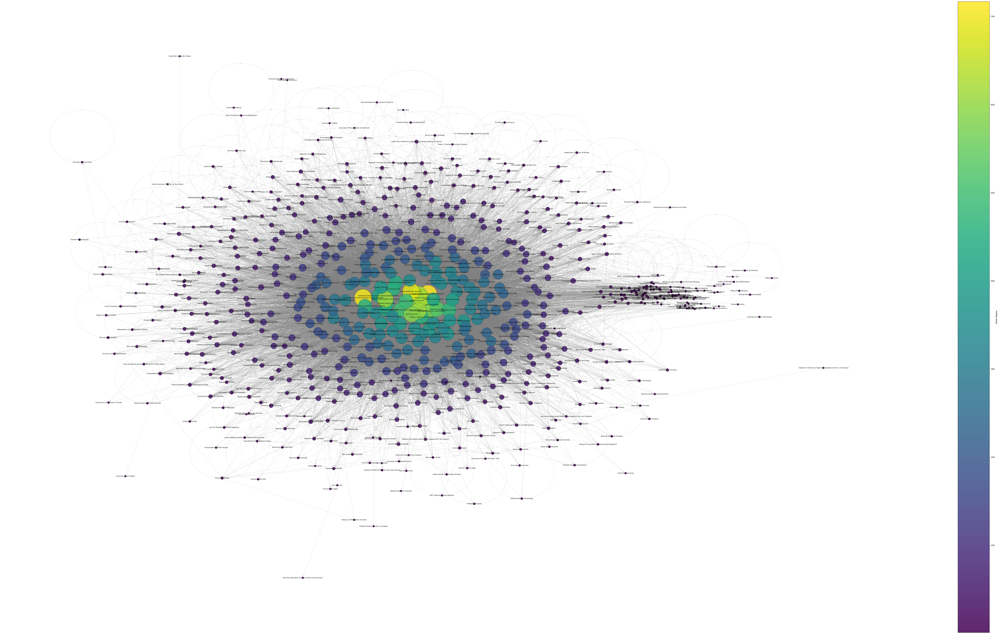

In [95]:
import matplotlib.pyplot as plt
plt.figure(figsize=(76.8, 43.2), dpi=100)

pos = nx.kamada_kawai_layout(G)

degrees = dict(G.degree())
node_sizes = [80 + degrees[n] * 10 for n in G.nodes()]   
node_colors = [degrees[n] for n in G.nodes()]            


nodes = nx.draw_networkx_nodes(
    G, pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="viridis",
    alpha=0.85,
    linewidths=0.5,
    edgecolors="black"
)


nx.draw_networkx_edges(
    G, pos,
    arrowstyle="-|>",
    arrowsize=10,
    edge_color="gray",
    alpha=0.3,
    width=0.8
)


nx.draw_networkx_labels(
    G, pos,
    font_size=7,
    font_color="black"
)


cbar = plt.colorbar(nodes)
cbar.set_label("Node degree")

plt.axis("off")
plt.tight_layout()
plt.savefig("graph_2.png", dpi=100, bbox_inches="tight")
plt.show()
